In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
#import scanorama
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

### Глобальные переменные

In [2]:
qc_palette = sns.color_palette(['red', 'gray'])

# Подгрузим файлы

In [3]:
# Define paths and get sample_ids
file_list = os.listdir('../data/raw_spatial_data/human/')
file_list

['human_759', 'human_j12', 'human_j3', 'human_j4', 'human_j6']

In [4]:
file = 'human_759'

In [5]:
# аннотация слоёв
ann = pd.read_csv('../data/clusters/' + file + '.csv', index_col=0)
ann.columns = ['label']
ann.head()

,label
Barcode,
AAACAACGAATAGTTC-1,WM
AAACAATCTACTAGCA-1,WM
AAACACCAATAACTGC-1,L5
AAACAGAGCGACTCCT-1,Empty spots
AAACAGCTTTCAGAAG-1,L2


In [6]:
# каунты секвенирования
human_759 = sc.read_visium('../data/raw_spatial_data/human/'+ file)
human_759.var_names_make_unique()
human_759.obs['label'] = ann.label
human_759.obs['sample_id'] = file

reading ..\data\raw_spatial_data\human\human_759\filtered_feature_bc_matrix.h5
 (0:00:00)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


# Human_759

## Посчитаем метрики

In [7]:
human_759.var['mt'] = human_759.var_names.str.startswith('MT-')
human_759.var['hb'] = human_759.var_names.str.contains(("^HB[AB]"))
human_759.var['ribo'] = human_759.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    human_759, qc_vars=['mt','hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

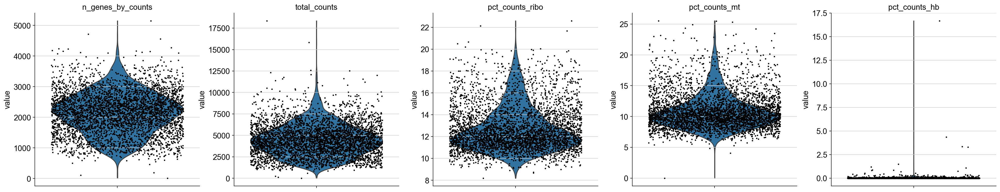

In [8]:
sc.pl.violin(human_759,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, rotation= 45, multi_panel=True, size=2.5)

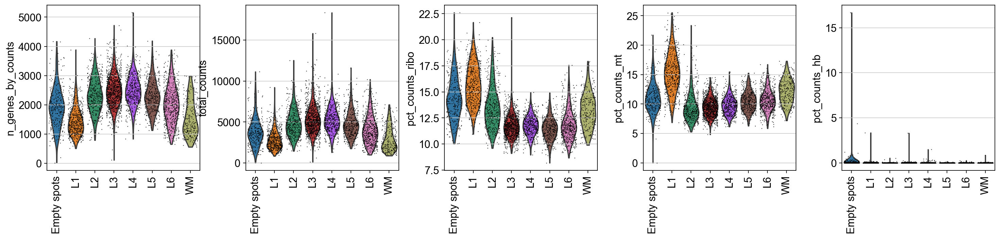

In [9]:
sc.pl.violin(human_759,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo','pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, groupby = 'label', rotation= 90)

Видим, что число каунтов и задетектированых генов занижено у `L1` и `WM` слоёв. А так же Число процент митохондриальных генов завышен в `L1` слое. Поэтому хотелось бы быть с ними аккуратнее.

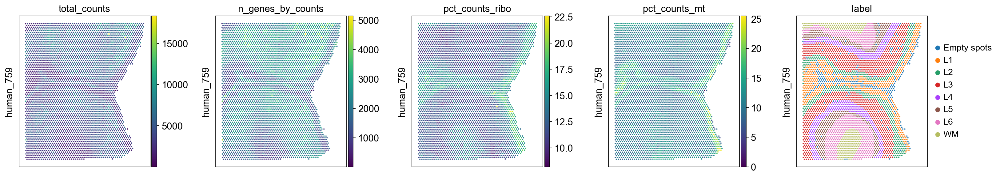

In [10]:
sq.pl.spatial_scatter(human_759,
                      color = ['total_counts', 'n_genes_by_counts','pct_counts_ribo','pct_counts_mt', 'label'],
                      ncols=5, img=False, axis_label=['', file])

### Libriary size

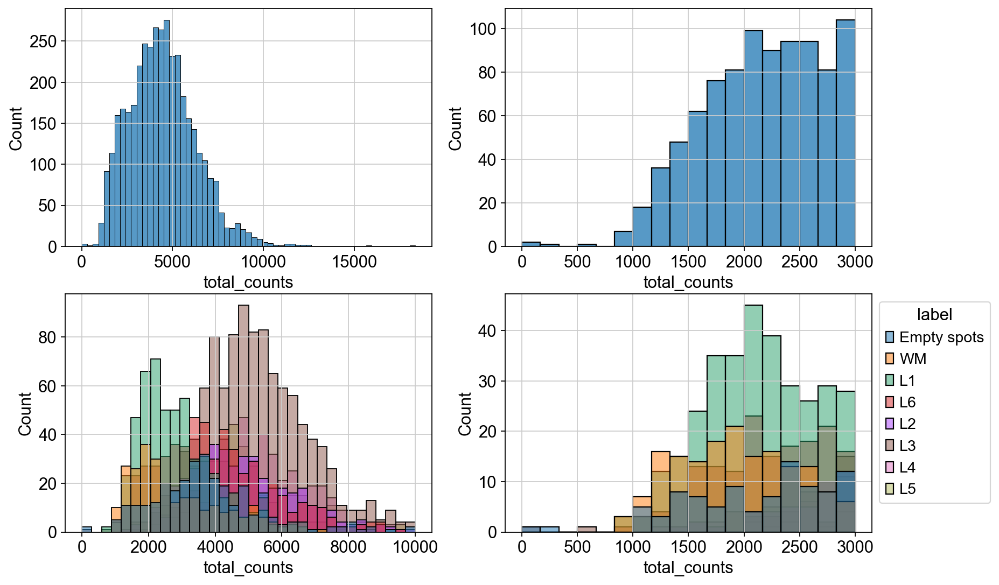

In [11]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(human_759.obs, x='total_counts', ax=axs[0][0])
sns.histplot(human_759.obs, x='total_counts', binrange=[0, 10000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(human_759.obs, x='total_counts', binrange=[0, 3000], ax=axs[0][1])
sns.histplot(human_759.obs, x='total_counts', binrange=[0, 3000], hue='label', hue_order=hue_order, ax=axs[1][1])
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Выберем порог по `total counts = 900`. Возможно стоит поставить порог побольше, но без учёта `WM` и `L1`

In [12]:
human_759.obs['qc_lib_size'] = (human_759.obs['total_counts'] > 900).astype('string')
#human_759.obs['qc_lib_size'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)

vc = human_759.obs.groupby('qc_lib_size')['label'].value_counts()
print(f"число образцов не прошедших порог N={human_759.obs['qc_lib_size'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=7

label
Empty spots    2
L1             2
L3             2
WM             1
Name: label, dtype: int64


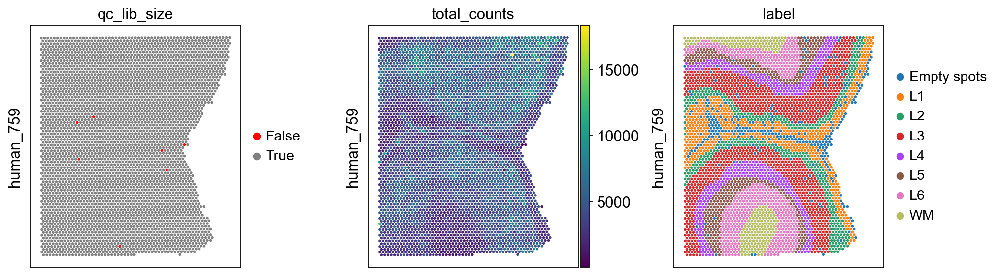

In [13]:
with qc_palette:
    sq.pl.spatial_scatter(human_759, color=['qc_lib_size', 'total_counts', 'label'], img=False, axis_label=['', file], size=1.3)

Не все тёмные некрасивые споты были словлены, возможно стоит увеличить порог. Так же может быть стоит поставить порог сверху. Есть слишком очевидно яркие споты

### Number of expressed features

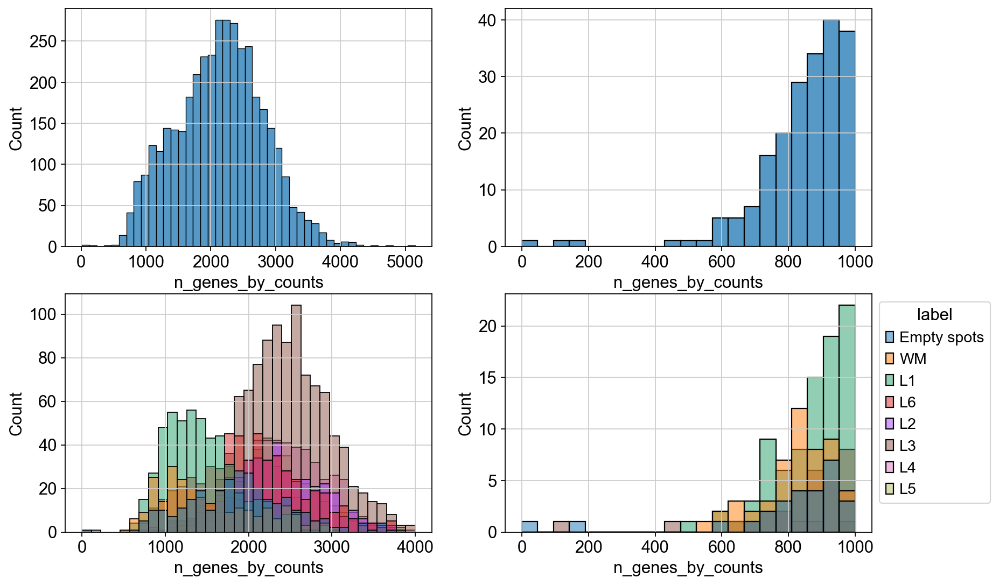

In [14]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(human_759.obs, x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(human_759.obs, x='n_genes_by_counts', binrange=[0, 4000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(human_759.obs, x='n_genes_by_counts', binrange=[0, 1000], ax=axs[0][1])
sns.histplot(human_759.obs, x='n_genes_by_counts', binrange=[0, 1000], hue='label', hue_order=hue_order, ax=axs[1][1])
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Выберем порог по `n_genes_by_counts = 600`. Возможно стоит поставить порог побольше, но без учёта `WM` и `L1`

In [15]:
human_759.obs['qc_n_genes'] = (human_759.obs['n_genes_by_counts'] > 600).astype('string')
#human_759.obs['qc_n_genes'].replace({True: 'True', False: 'False'}, inplace=True)
vc = human_759.obs.groupby('qc_n_genes')['label'].value_counts()
print(f"число образцов не прошедших порог N={human_759.obs['qc_n_genes'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=9

label
L1             3
Empty spots    2
L3             2
WM             2
Name: label, dtype: int64


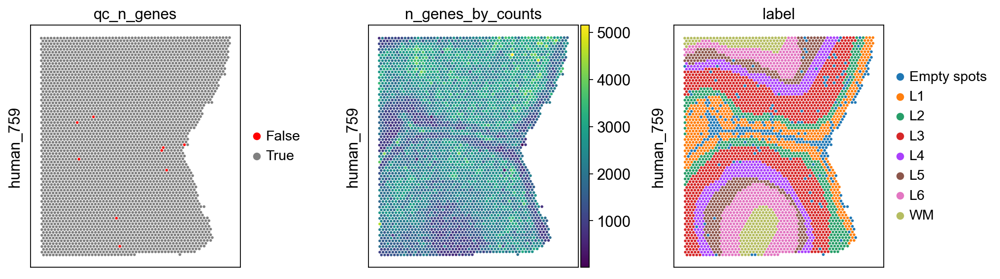

In [16]:
with qc_palette:
    sq.pl.spatial_scatter(human_759, color=['qc_n_genes', 'n_genes_by_counts', 'label'], img=False, axis_label=['', file], size=1.3)

Не все тёмные некрасивые споты были словлены, возможно стоит увеличить порог. Так же может быть стоит поставить порог сверху. Есть слишком очевидно яркие споты

### Proportion of mitochondrial reads

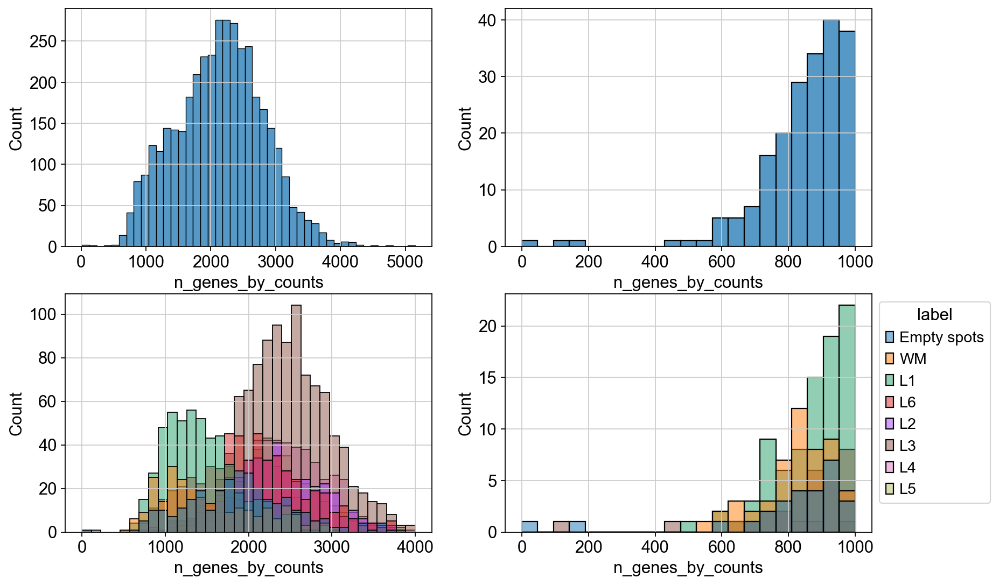

In [17]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(human_759.obs, x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(human_759.obs, x='n_genes_by_counts', binrange=[0, 4000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(human_759.obs, x='n_genes_by_counts', binrange=[0, 1000], ax=axs[0][1])
sns.histplot(human_759.obs, x='n_genes_by_counts', binrange=[0, 1000], hue='label', hue_order=hue_order, ax=axs[1][1])
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

`pct_counts_mt = 20`


По митохондриям порог применяется ко всем кроме `L1` слоя. Мне кажется проблемы по митохондриям в итоге только в `L2` слое.

In [18]:
human_759.obs['qc_mt'] = ((human_759.obs['pct_counts_mt'] <= 19) | (human_759.obs.label == 'L1')).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = human_759.obs.groupby('qc_mt')['label'].value_counts()
print(f"число образцов не прошедших порог N={human_759.obs['qc_mt'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=8

label
L2             5
Empty spots    3
Name: label, dtype: int64


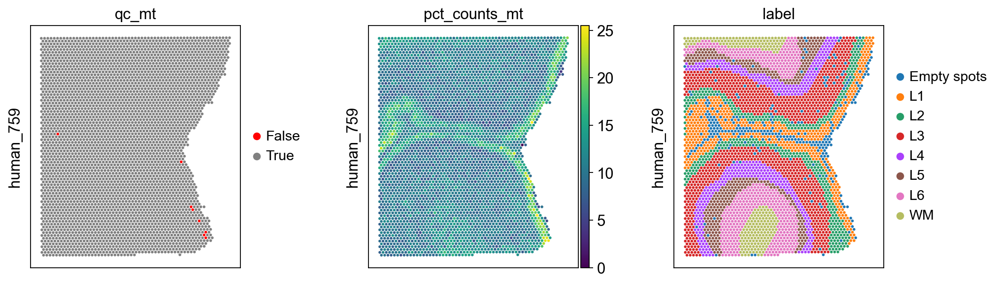

In [19]:
with qc_palette:
    sq.pl.spatial_scatter(human_759, color=['qc_mt', 'pct_counts_mt', 'label'], img=False, axis_label=['', file], size=1.3)

## Combined

### QC histplots

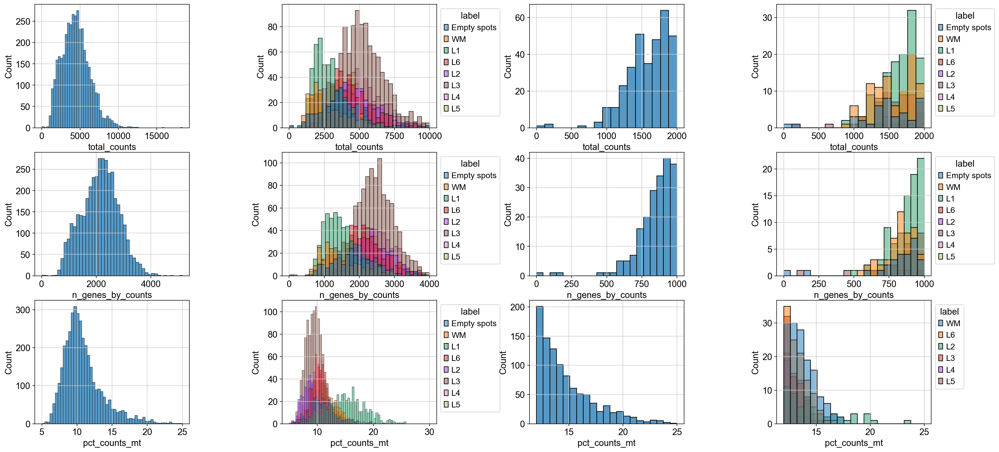

In [20]:
fig, axs = plt.subplots(3, 4, figsize=(25, 12), gridspec_kw={'wspace': 0.6, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(human_759.obs, x='total_counts', ax=axs[0][0])
sns.histplot(human_759.obs, x='total_counts', binrange=[0, 10000], hue='label', hue_order=hue_order, ax=axs[0][1])
sns.move_legend(axs[0][1], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(human_759.obs, x='total_counts', binrange=[0, 2000], ax=axs[0][2])
sns.histplot(human_759.obs, x='total_counts', binrange=[0, 2000], hue='label', hue_order=hue_order, ax=axs[0][3])
sns.move_legend(axs[0][3], "upper left", bbox_to_anchor=(1, 1))


sns.histplot(human_759.obs, x='n_genes_by_counts', ax=axs[1][0])
sns.histplot(human_759.obs, x='n_genes_by_counts', binrange=[0, 4000], hue='label', hue_order=hue_order, ax=axs[1][1])
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(human_759.obs, x='n_genes_by_counts', binrange=[0, 1000], ax=axs[1][2])
sns.histplot(human_759.obs, x='n_genes_by_counts', binrange=[0, 1000], hue='label', hue_order=hue_order, ax=axs[1][3])
sns.move_legend(axs[1][3], "upper left", bbox_to_anchor=(1, 1))


sns.histplot(human_759.obs, x='pct_counts_mt', binrange=[5, 25], ax=axs[2][0])
sns.histplot(human_759.obs, x='pct_counts_mt', binrange=[5, 30], hue='label', hue_order=hue_order, ax=axs[2][1])
sns.move_legend(axs[2][1], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(human_759.obs, x='pct_counts_mt', binrange=[12, 25], ax=axs[2][2])
sns.histplot(human_759.obs, x='pct_counts_mt', binrange=[12, 25], hue='label', hue_order=hue_order_mito, ax=axs[2][3])
sns.move_legend(axs[2][3], "upper left", bbox_to_anchor=(1, 1))

### QC spatial_scatter

In [21]:
d = {'True': True, 'False': False}
human_759.obs['qc_lib_size'] = human_759.obs['qc_lib_size'].astype(object).replace(d)
human_759.obs['qc_n_genes'] = human_759.obs['qc_n_genes'].astype(object).replace(d)
human_759.obs['qc_mt'] = human_759.obs['qc_mt'].astype(object).replace(d)

In [22]:
human_759.obs['qc_good_spots'] = (human_759.obs.qc_lib_size * human_759.obs.qc_n_genes * human_759.obs.qc_mt).astype('string')
vc = human_759.obs.groupby('qc_good_spots')['label'].value_counts()
print(f"число образцов не прошедших порог N={human_759.obs['qc_good_spots'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=17

label
Empty spots    5
L2             5
L1             3
L3             2
WM             2
Name: label, dtype: int64


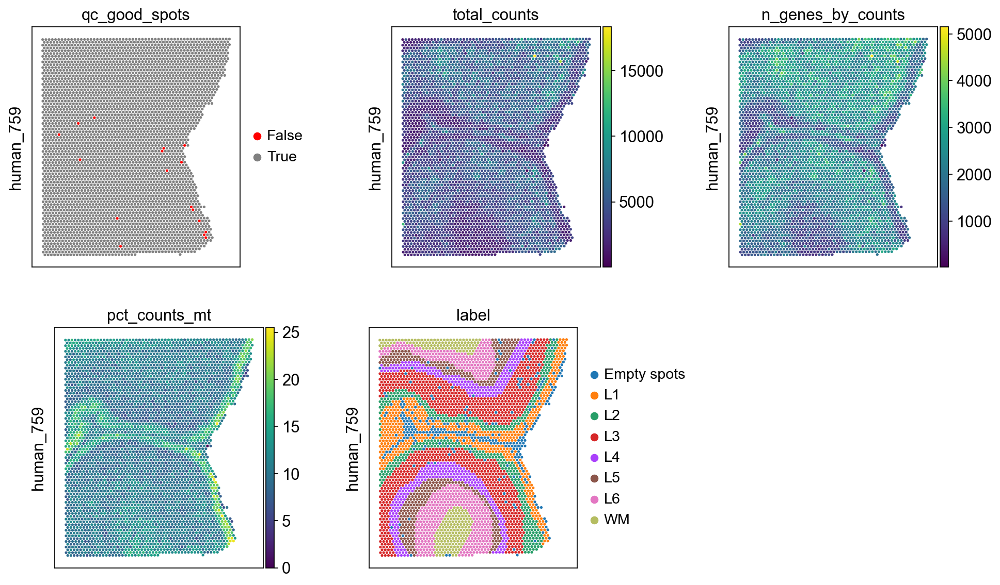

In [23]:
with qc_palette:
    sq.pl.spatial_scatter(human_759, color=['qc_good_spots',  'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'label'],
                          img=False, axis_label=['', file], size=1.3, ncols=3)

### QC scatter plots

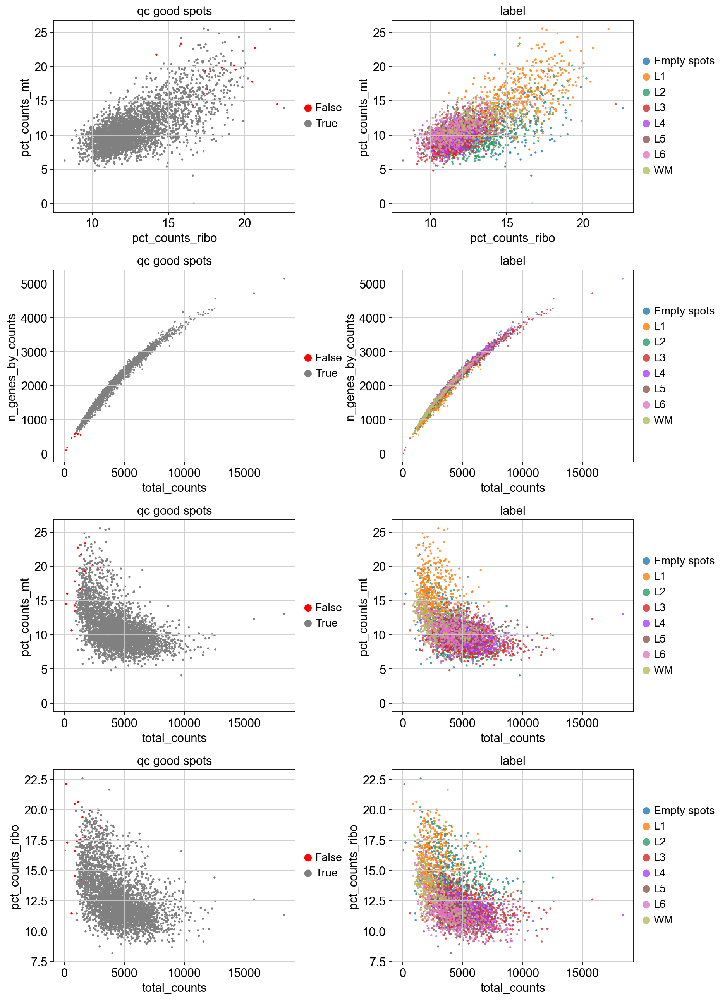

In [24]:
fig, ax = plt.subplots(4, 2, figsize=(12, 20), gridspec_kw={'wspace': 0.4, 'hspace': 0.3})
alpha = 0.8

sc.pl.scatter(human_759, x='pct_counts_ribo', y='pct_counts_mt', color="qc_good_spots", ax=ax[0][0], show=False, size=25)
sc.pl.scatter(human_759, x='pct_counts_ribo', y='pct_counts_mt', color="label", ax=ax[0][1], show=False, size=25, alpha=alpha)

sc.pl.scatter(human_759, x='total_counts', y='n_genes_by_counts', color="qc_good_spots", ax=ax[1][0], show=False, size=15)
sc.pl.scatter(human_759, x='total_counts', y='n_genes_by_counts', color="label", ax=ax[1][1], show=False, alpha=alpha, size=15)

sc.pl.scatter(human_759, x='total_counts', y='pct_counts_mt', color="qc_good_spots", ax=ax[2][0], show=False, size=25)
sc.pl.scatter(human_759, x='total_counts', y='pct_counts_mt', color="label", ax=ax[2][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(human_759, x='total_counts', y='pct_counts_ribo', color="qc_good_spots", ax=ax[3][0], show=False, size=25)
sc.pl.scatter(human_759, x='total_counts', y='pct_counts_ribo', color="label", ax=ax[3][1], show=False, alpha=alpha, size=25)
plt.show()

Меня всё же напрягают немного образцы со слишком большой глубиной секвенирования

### Cохраним отфильтрованые споты (без пустых)

In [25]:
good_spots = human_759.obs[(human_759.obs.qc_good_spots == 'True') & (human_759.obs.label != 'Empty spots')].index

In [26]:
human_759_filtered = human_759[good_spots].copy()

### PCA

In [ ]:
sc.tl.pca(human_759)

computing PCA
    with n_comps=50


In [ ]:
sc.pl.pca(human_759, color=['qc_good_spots', 'label'], show=True)

Вот эти два спота справа меня, конечно, напрягают

## Сохраним в .h5ad

In [ ]:
human_759_filtered.obs.drop(['qc_lib_size','qc_n_genes', 'qc_mt', 'qc_good_spots'], axis=1, inplace=True)

In [ ]:
os.makedirs('../results/filtered_samples', exist_ok=True)
os.makedirs('../results/filtered_samples/human', exist_ok=True)
human_759_filtered.write_h5ad(f'../results/filtered_samples/human/{file}.h5ad')